# **Installing the required libraries**

In [1]:
# Install the required libraries
!pip install geocoder
!pip install folium
!pip install plotly
!pip install geopy

# **Importing the required libraries**

In [2]:
# Import the required libraries
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import re
import plotly.express as px
from scipy import stats
from scipy.stats import norm
from scipy.stats.stats import pearsonr
import folium # map rendering library
from geopy.extra.rate_limiter import RateLimiter
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values
# Regressors 
from sklearn import linear_model
from sklearn.linear_model import Ridge, ElasticNet, Lasso,  BayesianRidge, LassoLarsIC, LinearRegression
from sklearn.ensemble import RandomForestRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.tree import DecisionTreeRegressor
import xgboost as xgb
# Model selection and validation
from sklearn.model_selection import train_test_split, ShuffleSplit, cross_val_score, GridSearchCV, RandomizedSearchCV, cross_validate
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
# Pipeline
from sklearn.base import TransformerMixin,BaseEstimator, RegressorMixin
from sklearn.pipeline import Pipeline

import warnings
warnings.filterwarnings("ignore")

/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# **Creating Dataframe**

In [3]:
# Import dataset along with coordinates
house_df = pd.read_csv("Bengaluru_data.csv")
house_df.head()

,area_type,availability,location,size,society,total_sqft,bath,balcony,price,Latitude,Longitude
0,Super built-up Area,19-Dec,"Electronic City Phase II, Bangalore",2 BHK,Coomee,1056,2.0,1.0,39.07,12.848672,77.677529
1,Plot Area,Ready To Move,"Chikka Tirupathi, Bangalore",4 Bedroom,Theanmp,2600,5.0,3.0,120.00,12.904190,77.505480
2,Built-up Area,Ready To Move,"Uttarahalli, Bangalore",3 BHK,NaN,1440,2.0,3.0,62.00,12.897570,77.528300
3,Super built-up Area,Ready To Move,"Lingadheeranahalli, Bangalore",3 BHK,Soiewre,1521,3.0,1.0,95.00,13.001340,77.479150
4,Super built-up Area,Ready To Move,"Kothanur, Bangalore",2 BHK,NaN,1200,2.0,1.0,51.00,13.064340,77.648550


# **Dataset structure and Data types of each features**

In [4]:
# Check the no.of rows and columns
house_df.shape

(13320, 11)

In [5]:
house_df.dtypes

area_type        object
availability     object
location         object
size             object
society          object
total_sqft       object
bath            float64
balcony         float64
price           float64
Latitude        float64
Longitude       float64
dtype: object

In [6]:
house_df.columns

Index(['area_type', 'availability', 'location', 'size', 'society',
       'total_sqft', 'bath', 'balcony', 'price', 'Latitude', 'Longitude'],
      dtype='object')

In [7]:
# Lets check the price description
house_df['price'].describe()

count    13320.000000
mean       112.565627
std        148.971674
min          8.000000
25%         50.000000
50%         72.000000
75%        120.000000
max       3600.000000
Name: price, dtype: float64

# **Probability distribution of House Sale Price**


 mu = 112.57 and sigma = 148.97



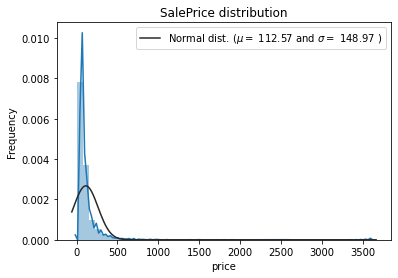

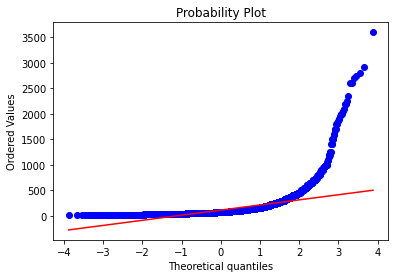

Skewness: 8.064469
Kurtosis: 108.166513


In [8]:
# Lets check the price distribution
# Plot Histogram
sns.distplot(house_df['price'] , fit=norm);

# Get the fitted parameters used by the function
(mu, sigma) = norm.fit(house_df['price'])
print( '\n mu = {:.2f} and sigma = {:.2f}\n'.format(mu, sigma))
plt.legend(['Normal dist. ($\mu=$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu, sigma)],
            loc='best')
plt.ylabel('Frequency')
plt.title('SalePrice distribution')

fig = plt.figure()
res = stats.probplot(house_df['price'], plot=plt)
plt.show()

print("Skewness: %f" % house_df['price'].skew())
print("Kurtosis: %f" % house_df['price'].kurt())

In [9]:
house_df.isnull().sum()

area_type          0
availability       0
location           0
size              16
society         5502
total_sqft         0
bath              73
balcony          609
price              0
Latitude           0
Longitude          0
dtype: int64

In [10]:
# Find Missing Ratio of Dataset
all_data_na = (house_df.isnull().sum() / len(house_df)) * 100
all_data_na = all_data_na.drop(all_data_na[all_data_na == 0].index).sort_values(ascending=False)[:30]
missing_data = pd.DataFrame({'Missing Ratio' :all_data_na})
missing_data

,Missing Ratio
society,41.306306
balcony,4.572072
bath,0.548048
size,0.120120


# **Data Cleaning**

Checking for missing values in the dataset

Text(0.5, 1.0, 'Percentage of missing data by feature')

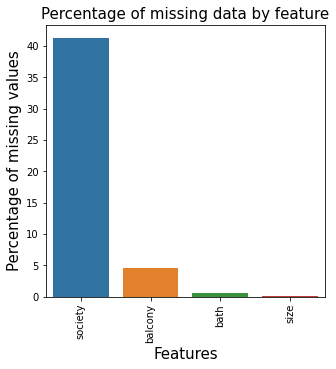

In [11]:
#Percentage of missing data by feature
f, ax = plt.subplots(figsize=(5, 5))
plt.xticks(rotation='90')
sns.barplot(x=all_data_na.index, y=all_data_na)
plt.xlabel('Features', fontsize=15)
plt.ylabel('Percentage of missing values', fontsize=15)
plt.title('Percentage of missing data by feature', fontsize=15)

In [12]:
# Drop un-necessary columns such as availability and society, balcony and area type
house_df.drop(['availability','society', 'area_type', 'balcony'], inplace=True, axis='columns')
# Verify whether the columns are dropped
house_df.columns

Index(['location', 'size', 'total_sqft', 'bath', 'price', 'Latitude',
       'Longitude'],
      dtype='object')

In [13]:
# Removing rows that has missing values in each feature
house_df = house_df.dropna()
house_df.isnull().sum()

location      0
size          0
total_sqft    0
bath          0
price         0
Latitude      0
Longitude     0
dtype: int64

In [14]:
# Check any irrelevant records are present in these features

print("Location:", house_df['location'].unique(), "\n")
print("Size:", house_df['size'].unique(), "\n")
print("total_sqft:", house_df['total_sqft'].unique(), "\n")
print("bath:", house_df['bath'].unique(), "\n")
print("Price:", house_df['price'].unique())


Location: ['Electronic City Phase II, Bangalore' 'Chikka Tirupathi, Bangalore'
 'Uttarahalli, Bangalore' ...
 '12th cross srinivas nagar banshankari 3rd stage, Bangalore'
 'Havanur extension, Bangalore' 'Abshot Layout, Bangalore'] 

Size: ['2 BHK' '4 Bedroom' '3 BHK' '4 BHK' '6 Bedroom' '3 Bedroom' '1 BHK'
 '1 RK' '1 Bedroom' '8 Bedroom' '2 Bedroom' '7 Bedroom' '5 BHK' '7 BHK'
 '6 BHK' '5 Bedroom' '11 BHK' '9 BHK' '9 Bedroom' '27 BHK' '10 Bedroom'
 '11 Bedroom' '10 BHK' '19 BHK' '16 BHK' '43 Bedroom' '14 BHK' '8 BHK'
 '12 Bedroom' '13 BHK' '18 Bedroom'] 

total_sqft: ['1056' '2600' '1440' ... '1133 - 1384' '774' '4689'] 

bath: [ 2.  5.  3.  4.  6.  1.  9.  8.  7. 11. 10. 14. 27. 12. 16. 40. 15. 13.
 18.] 

Price: [ 39.07 120.    62.   ...  40.14 231.   488.  ]


# ***Cleaning Bedroom Size feature***

In [15]:
# Cleaning 'Size' column
house_df['Bedroom'] = house_df['size'].apply(lambda x: int(x.split(' ')[0]))
house_df.Bedroom.unique()

array([ 2,  4,  3,  6,  1,  8,  7,  5, 11,  9, 27, 10, 19, 16, 43, 14, 12,
       13, 18])

# ***Cleaning House Area Size feature***


In [0]:
# Total_sqft feature is of data type object. Lets check for discrepencies in this feature.
# Creating a function that will convert every valid values to float ex. 1056, 
# but if an unvalid value like 1133 - 1384 is fed, then it should not convert it into float and instead return false
def is_float(x):
    try:
        float(x)
    except:
        return False
    return True

In [17]:
# Checking for vivid entries in total_sqft column
house_df[~house_df['total_sqft'].apply(is_float)].head(10)

,location,size,total_sqft,bath,price,Latitude,Longitude,Bedroom
30,"Yelahanka, Bangalore",4 BHK,2100 - 2850,4.0,186.000,13.099310,77.592590,4
122,"Hebbal, Bangalore",4 BHK,3067 - 8156,4.0,477.000,13.049810,77.589030,4
137,"8th Phase JP Nagar, Bangalore",2 BHK,1042 - 1105,2.0,54.005,12.862699,77.573583,2
165,"Sarjapur, Bangalore",2 BHK,1145 - 1340,2.0,43.490,12.860750,77.783550,2
188,"KR Puram, Bangalore",2 BHK,1015 - 1540,2.0,56.800,12.997058,77.717327,2
410,"Kengeri, Bangalore",1 BHK,34.46Sq. Meter,1.0,18.500,12.908700,77.487140,1
549,"Hennur Road, Bangalore",2 BHK,1195 - 1440,2.0,63.770,13.031069,77.643897,2
648,"Arekere, Bangalore",9 Bedroom,4125Perch,9.0,265.000,12.885680,77.596680,9
661,"Yelahanka, Bangalore",2 BHK,1120 - 1145,2.0,48.130,13.099310,77.592590,2
672,"Bettahalsoor, Bangalore",4 Bedroom,3090 - 5002,4.0,445.000,13.155020,77.605010,4


In [0]:
# User defined function to take average of two values
def convert_sqft_to_num(x):
    tokens = x.split('-')
    if len(tokens) == 2:
        return (float(tokens[0])+float(tokens[1]))/2
    try:
        return float(x)
    except:
        return None

In [19]:
# Cleaning 'total_sqft' feature
house_df.total_sqft = house_df.total_sqft.apply(convert_sqft_to_num)
house_df = house_df[house_df.total_sqft.notnull()]
house_df.head(5)

,location,size,total_sqft,bath,price,Latitude,Longitude,Bedroom
0,"Electronic City Phase II, Bangalore",2 BHK,1056.0,2.0,39.07,12.848672,77.677529,2
1,"Chikka Tirupathi, Bangalore",4 Bedroom,2600.0,5.0,120.00,12.904190,77.505480,4
2,"Uttarahalli, Bangalore",3 BHK,1440.0,2.0,62.00,12.897570,77.528300,3
3,"Lingadheeranahalli, Bangalore",3 BHK,1521.0,3.0,95.00,13.001340,77.479150,3
4,"Kothanur, Bangalore",2 BHK,1200.0,2.0,51.00,13.064340,77.648550,2


In [20]:
# Lets check datatype of each feature
house_df.dtypes

location       object
size           object
total_sqft    float64
bath          float64
price         float64
Latitude      float64
Longitude     float64
Bedroom         int64
dtype: object

In [21]:
house_df.loc[15]

location      Mysore Road, Bangalore
size                           2 BHK
total_sqft                      1175
bath                               2
price                           73.5
Latitude                     12.9616
Longitude                    77.5604
Bedroom                            2
Name: 15, dtype: object

## **Data Visualization**

##### **Box Plot of Bathroom size vs Price**

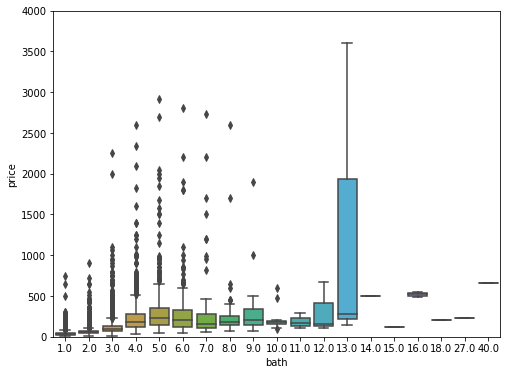

In [22]:
# bath vs  Price
var = 'bath'
data = pd.concat([house_df['price'], house_df[var]], axis=1)
f, ax = plt.subplots(figsize=(8, 6))
fig = sns.boxplot(x=var, y="price", data=data)
fig.axis(ymin=0, ymax=4000);

##### **Regression Plot of Total sqft area of house vs Price**

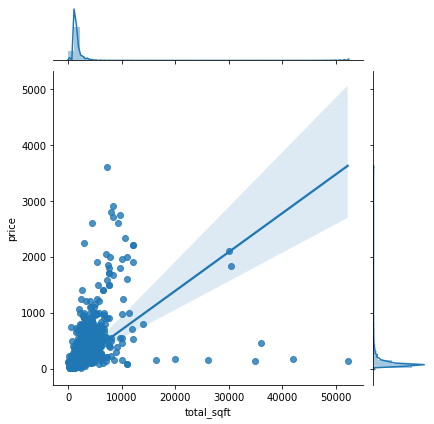

In [23]:
# Square feet vs Sale Price
sns.jointplot(x=house_df['total_sqft'], y=house_df['price'], kind='reg')

##### ***Removing outliers by observing the visual representation. The data points in the bottom right corner are considered as outliers***

In [0]:
# Removing outliers manually (Two points in the bottom right)
house_df = house_df.drop(house_df[(house_df['total_sqft']>20000) 
                         & (house_df['price']<3000)].index).reset_index(drop=True)

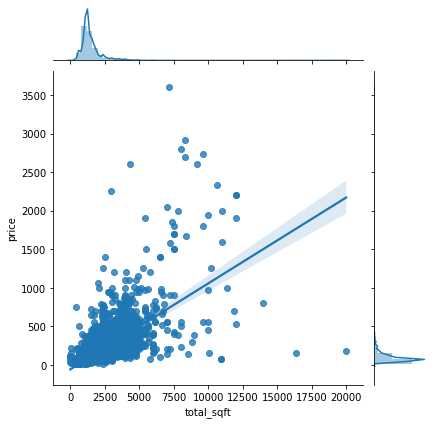

In [25]:
# Regression plot after removing outliers
sns.jointplot(x=house_df['total_sqft'], y=house_df['price'], kind='reg')

##### **Box Plot of Bedroom size vs Price**

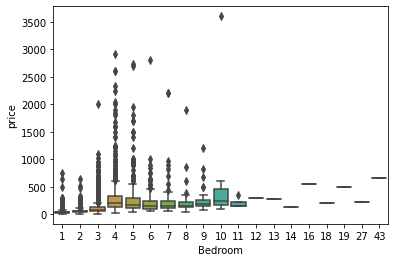

In [26]:
# size vs  Price
sns.boxplot(x=house_df['Bedroom'], y=house_df['price'])

##### **Regression Plot of Bedroom size vs Price**

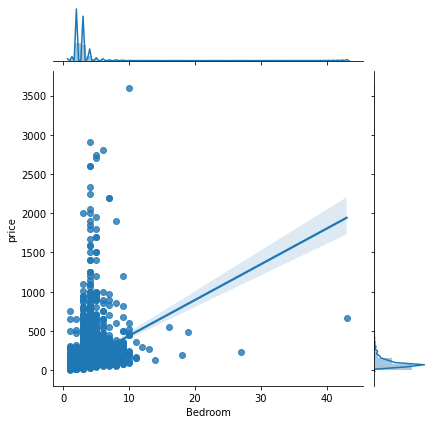

In [27]:
# Regression plot of Bedroom Size vs Price
sns.jointplot(x=house_df['Bedroom'], y=house_df['price'], kind='reg')

# **Feature Engineering**

##### **Removing outliers from data related to price and total sqft per location.**

In [28]:
# Creating a new feature called 'price_pre_sqft' to remove outliers from data related to price and total sqft per location.
house_df['price_per_sqft'] = house_df['price']*100000/house_df['total_sqft']
house_df.head()

,location,size,total_sqft,bath,price,Latitude,Longitude,Bedroom,price_per_sqft
0,"Electronic City Phase II, Bangalore",2 BHK,1056.0,2.0,39.07,12.848672,77.677529,2,3699.810606
1,"Chikka Tirupathi, Bangalore",4 Bedroom,2600.0,5.0,120.00,12.904190,77.505480,4,4615.384615
2,"Uttarahalli, Bangalore",3 BHK,1440.0,2.0,62.00,12.897570,77.528300,3,4305.555556
3,"Lingadheeranahalli, Bangalore",3 BHK,1521.0,3.0,95.00,13.001340,77.479150,3,6245.890861
4,"Kothanur, Bangalore",2 BHK,1200.0,2.0,51.00,13.064340,77.648550,2,4250.000000


In [29]:
house_df['price_per_sqft'].describe()

count    1.319400e+04
mean     7.923565e+03
std      1.067513e+05
min      5.000000e+02
25%      4.270007e+03
50%      5.439078e+03
75%      7.317073e+03
max      1.200000e+07
Name: price_per_sqft, dtype: float64

### ***Dimensionality Reduction - Dealing with location feature***

##### ****Any location having less than 10 data points is tagged as 'other' location. By this way the number of categories can be reduced by huge amount. Later one hot encoding is done which has fewer dummy columns****

In [30]:
len(house_df['location'].unique())

1299

In [31]:
# How many data points are available per location?
# We will use strip() just to delete any leading or trailing space

house_df.location = house_df.location.apply(lambda x: x.strip())
location_stats = house_df['location'].value_counts(ascending=False)
location_stats

Whitefield, Bangalore                                        533
Sarjapur  Road, Bangalore                                    392
Electronic City, Bangalore                                   304
Kanakpura Road, Bangalore                                    264
Thanisandra, Bangalore                                       235
                                                            ... 
Binnamangala, Bangalore                                        1
Ananthanagar Phase 1,Electronic City , phase 2, Bangalore      1
Shirdi Sai Nagar, Bangalore                                    1
Goraguntepalya, Bangalore                                      1
Gandhi Nagar, Bangalore                                        1
Name: location, Length: 1288, dtype: int64

In [32]:
# Total number of locations in the dataset
location_stats.values.sum()

13194

In [33]:
# Total number of unique location having more than 10 houses
len(location_stats[location_stats > 10])

240

In [34]:
# Total number of unique locations
len(location_stats)

1288

In [35]:
# Total number of unique locations having less than 10 houses
len(location_stats[location_stats <= 10])

1048

In [36]:
# Unique locations having less than 10 houses
location_stats_less_than_10 = location_stats[location_stats <= 10]
location_stats_less_than_10

1st Block Koramangala, Bangalore                             10
Sadashiva Nagar, Bangalore                                   10
Naganathapura, Bangalore                                     10
Kalkere, Bangalore                                           10
Nagappa Reddy Layout, Bangalore                              10
                                                             ..
Binnamangala, Bangalore                                       1
Ananthanagar Phase 1,Electronic City , phase 2, Bangalore     1
Shirdi Sai Nagar, Bangalore                                   1
Goraguntepalya, Bangalore                                     1
Gandhi Nagar, Bangalore                                       1
Name: location, Length: 1048, dtype: int64

In [37]:
# tagging the locations having less than 10 houses as 'other'
house_df.location = house_df.location.apply(lambda x: 'other' if x in location_stats_less_than_10 else x)
len(house_df.location.unique())

241

In [38]:
house_df.head()

,location,size,total_sqft,bath,price,Latitude,Longitude,Bedroom,price_per_sqft
0,"Electronic City Phase II, Bangalore",2 BHK,1056.0,2.0,39.07,12.848672,77.677529,2,3699.810606
1,"Chikka Tirupathi, Bangalore",4 Bedroom,2600.0,5.0,120.00,12.904190,77.505480,4,4615.384615
2,"Uttarahalli, Bangalore",3 BHK,1440.0,2.0,62.00,12.897570,77.528300,3,4305.555556
3,"Lingadheeranahalli, Bangalore",3 BHK,1521.0,3.0,95.00,13.001340,77.479150,3,6245.890861
4,"Kothanur, Bangalore",2 BHK,1200.0,2.0,51.00,13.064340,77.648550,2,4250.000000


### **Removing outliers from 'Bedroom' feature**

<function seaborn.utils.despine>

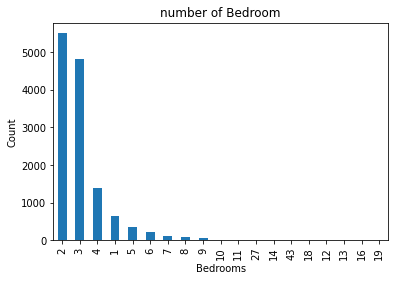

In [39]:
# Bar plot of Bedroom size
house_df['Bedroom'].value_counts().plot(kind='bar')
plt.title('number of Bedroom')
plt.xlabel('Bedrooms')
plt.ylabel('Count')
sns.despine

#### **Considering that the normal size of a bedroom as 300square ft, if the total area of the house is less than the sum of size of bedrooms then we consider them as outliers. For eg., If you have 400sqft house with 2 bedrooms they are considered as outliers as size of a single bedroom is considered to be 300 square ft.**

In [40]:
# Number of houses with area size less than the standard bedroom size.
len(house_df[house_df['total_sqft']/house_df['Bedroom'] <300])

744

In [41]:
# Few records from Bedroom outliers
house_df[house_df.total_sqft/house_df.Bedroom <300].head()

,location,size,total_sqft,bath,price,Latitude,Longitude,Bedroom,price_per_sqft
9,other,6 Bedroom,1020.0,6.0,370.0,12.944780,77.572130,6,36274.509804
45,"HSR Layout, Bangalore",8 Bedroom,600.0,9.0,200.0,12.912160,77.644900,8,33333.333333
57,"Murugeshpalya, Bangalore",6 Bedroom,1407.0,4.0,150.0,12.955650,77.653350,6,10660.980810
67,"Devarachikkanahalli, Bangalore",8 Bedroom,1350.0,7.0,85.0,12.888330,77.617640,8,6296.296296
69,other,3 Bedroom,500.0,3.0,100.0,12.964806,77.597001,3,20000.000000


##### ****Here we can seee that size of 8 bedroom house is 600 sqft which is not acceptable. Hence they are considered as outliers.****

In [0]:
# Removing the bedroom outliers
house_df = house_df[~(house_df.total_sqft/house_df.Bedroom < 300)]

In [43]:
# Shape of the dataset after removing outliers
house_df.shape

(12450, 9)

In [44]:
# Checking the statistics of 'price_per_sqft' feature
house_df['price_per_sqft'].describe()

count     12450.000000
mean       6310.699306
std        4167.544819
min         500.000000
25%        4210.526316
50%        5294.117647
75%        6916.666667
max      176470.588235
Name: price_per_sqft, dtype: float64

##### ****Here we can see that min price per sqft is 500 and max price per sqft is 176470. which shows wide variation in property prices. We remove outliers per location using mean and std deviation.****

In [0]:
# Function to remove outliers from price_per_sqft based on locations as every location will have different price range.

def remove_pps_outliers(house_df):
    df_out = pd.DataFrame()
    for key, subdf in house_df.groupby('location'): # 'key' variable stores cities and 'subdf' stores rows for each city
        m = np.mean(subdf['price_per_sqft'])
        st = np.std(subdf['price_per_sqft'])
        # data without outliers: 
        reduced_df = subdf[(subdf['price_per_sqft'] > (m-st)) & (subdf['price_per_sqft'] <= (m+st))]
        df_out = pd.concat([df_out, reduced_df], ignore_index = True)
    return df_out

In [46]:
# Removing the outliers and checking the shape of the dataset
house_df = remove_pps_outliers(house_df)
house_df.shape

(10240, 9)

#### **Removing outliers related to bedroom size and location**

##### **If the sqft area of 2-Bedroom house is more than sqft area of 3Bedroom house, then the price of 2-Bedroom being more than 3-Bedroom is justifiable. But, in some cases, the price of 2-Bedroom houses are more than 3-Bedroom houses even with the same sqft area or less, this could be because of many reasons like the 2-Bedroom house can be in some prime location and thats the reason it might be costly. We will investigate by scatter plot of location vs price vs Bedroom size**

###### ****Let's check for a given location how does the 2 BHK and 3 BHK property prices look like****

In [0]:
# User defined function to plot 2 and 3 bedrooms 
def plot_price_per_sqft(house_df, location):
    bhk2 = house_df[(house_df['location'] == location) & (house_df['Bedroom'] == 2)]
    bhk3 = house_df[(house_df['location'] == location) & (house_df['Bedroom'] == 3)]
    plt.figure(figsize = (10,5))
    plt.scatter(bhk2['total_sqft'], bhk2['price'],color = 'blue', label = '2BHK',)
    plt.scatter(bhk3['total_sqft'], bhk3['price'], marker = '+',color = 'red', label = '3BHK')
    plt.xlabel('Total Square Feet Area')
    plt.ylabel('Price (Lakhs in Indian Rupees)')
    plt.title(location)
    plt.legend()

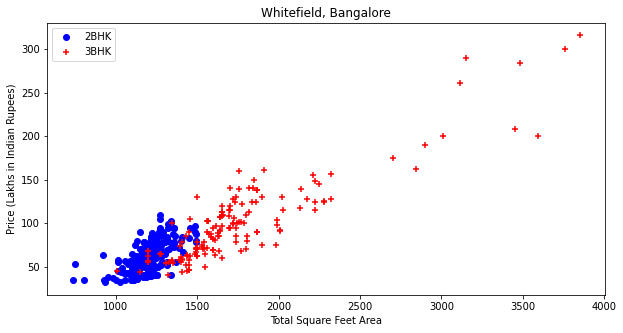

In [48]:
# Plot of 2 and 3 Bedroom size vs Price for a location 
plot_price_per_sqft(house_df, 'Whitefield, Bangalore')

##### ***As can be seen, the price for 2BHK houses are more than 3BHK houses for the same location (Whitefield, Bangalore) and for the same sqft (at 1000 and 1500***

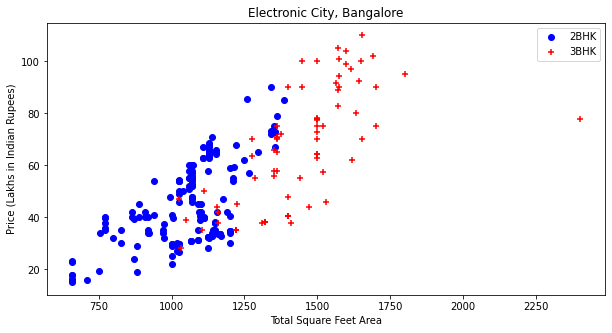

In [49]:
plot_price_per_sqft(house_df, 'Electronic City, Bangalore')

Now we remove those 2 Bedroom houses whose price_per_sqft is less than mean price_per_sqft of 1 Bedroom house.

In [0]:
# user defined function to remove the outliers using mean and std deviation
def remove_bhk_outliers(house_df):
    exclude_indices = np.array([])
    for location, location_df in house_df.groupby('location'):
        bhk_stats = {}
        for bhk, bhk_df in location_df.groupby('Bedroom'):
            bhk_stats[bhk] = {
                'mean': np.mean(bhk_df.price_per_sqft),
                'std': np.std(bhk_df.price_per_sqft),
                'count': bhk_df.shape[0] #shape would have given RowsXColumns, we want only number of rows, so shape[0]
            }
        for bhk, bhk_df in location_df.groupby('Bedroom'):
            stats = bhk_stats.get(bhk-1)
            if stats and stats['count']>5:
                exclude_indices = np.append(exclude_indices, bhk_df[bhk_df.price_per_sqft<(stats['mean'])].index.values)
    return house_df.drop(exclude_indices,axis='index')

In [51]:
# Shape of the dataset before removing outliers
house_df.shape

(10240, 9)

In [52]:
# Shapre of dataset after removing outliers
house_df = remove_bhk_outliers(house_df)
house_df.shape

(7317, 9)

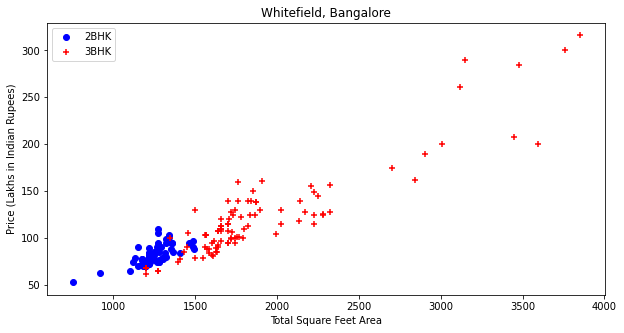

In [53]:
# Bedroom size vs Price plot per location after removing outliers
plot_price_per_sqft(house_df, 'Whitefield, Bangalore')

### **Removing Outliers in Number of bathroom feature.**

In [54]:
# Checking the number of bathrooms in a house.
house_df['bath'].unique()

array([ 4.,  3.,  2.,  5.,  8.,  1.,  6.,  7.,  9., 12., 16., 13.])

In [55]:
# Number of Bedrooms and Bathrooms
house_df[['Bedroom','bath']]

,Bedroom,bath
0,4,4.0
1,3,3.0
2,3,2.0
3,3,2.0
4,2,2.0
...,...,...
10231,2,2.0
10232,1,1.0
10235,2,2.0
10236,1,1.0


Investigating outlier using scatter plot.

Text(0.5, 1.0, 'Bedrooms VS Bathrooms')

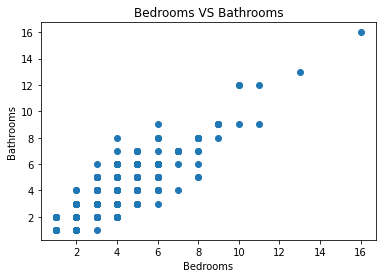

In [56]:
# Scatter plot BHK VS Bath
plt.scatter(data = house_df, x = 'Bedroom' , y = 'bath')
plt.xlabel('Bedrooms')
plt.ylabel('Bathrooms')
plt.title('Bedrooms VS Bathrooms')

##### ***From scatter plot it can be seen that we have more number of bathrooms than bedrooms in a house. For example for 4 Bedroom house we have 6,7 and 8 bathrooms which doesn't look right. Having 2 more bathrooms than number of bedrooms in a house is unusual.***



##### ***For a 4 Bedroom house there could be 4+2 bathrooms. Anything above these are outliers in the dataset.***

In [57]:
# Checking the records which have 2 plus more bathrooms than bedrooms.
house_df[(house_df['bath']) > (house_df['Bedroom']+2)]

,location,size,total_sqft,bath,price,Latitude,Longitude,Bedroom,price_per_sqft
1626,"Chikkabanavar, Bangalore",4 Bedroom,2460.0,7.0,80.0,13.081540,77.502920,4,3252.032520
5238,"Nagasandra, Bangalore",4 Bedroom,7000.0,8.0,450.0,13.044950,77.501560,4,6428.571429
6711,"Thanisandra, Bangalore",3 BHK,1806.0,6.0,116.0,13.055990,77.632550,3,6423.034330
8407,other,6 BHK,11338.0,9.0,1000.0,12.976197,77.768615,6,8819.897689


In [58]:
# Shape of dataset before removing outliers
house_df.shape

(7317, 9)

In [0]:
# Removing the outliers
house_df = house_df[(house_df['bath']) < (house_df['Bedroom']+2)]

In [60]:
# Shape of dataset after removing outliers
house_df.shape

(7239, 9)

In [61]:
# Few records after removing these outliers
house_df.head()

,location,size,total_sqft,bath,price,Latitude,Longitude,Bedroom,price_per_sqft
0,"1st Block Jayanagar, Bangalore",4 BHK,2850.0,4.0,428.0,12.9395,77.58981,4,15017.543860
1,"1st Block Jayanagar, Bangalore",3 BHK,1630.0,3.0,194.0,12.9395,77.58981,3,11901.840491
2,"1st Block Jayanagar, Bangalore",3 BHK,1875.0,2.0,235.0,12.9395,77.58981,3,12533.333333
3,"1st Block Jayanagar, Bangalore",3 BHK,1200.0,2.0,130.0,12.9395,77.58981,3,10833.333333
4,"1st Block Jayanagar, Bangalore",2 BHK,1235.0,2.0,148.0,12.9395,77.58981,2,11983.805668


### **Saving the feature engineered dataset to a new csv file**

In [0]:
# Save the feature engineered data to a new file for further processing
house_df.to_csv(r'Bengaluru_data_cleaned.csv', index = False)

## **Data Visualization using Folium Map**

In [63]:
# get the coordinates of Bangalore
address = 'Bangalore, India'

geolocator = Nominatim(user_agent="my-application")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinate of Bangalore, India {}, {}.'.format(latitude, longitude))

The geograpical coordinate of Bangalore, India 12.9791198, 77.5912997.


In [64]:
house_map = folium.Map(location=[latitude, longitude], zoom_start=11)

for lat, lon, location, price, sqft, bedroom in zip(house_df['Latitude'], house_df['Longitude'], house_df['location'], house_df['price'], house_df['total_sqft'], house_df['Bedroom']):
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup = ('Location: ' + str(location).capitalize() + '<br>'
                 'Price: ' + str(price) + ' Lakhs' + '<br>'
                 'Size: ' + str(sqft) + ' sqft' + '<br>'
                 'Bedrooms: ' + str(bedroom)
                ),
        color='blue',
        # key_on = color,
        # threshold_scale=[0,1,2,3],
        fill_color='#3186cc',
        fill=True,
        fill_opacity=0.7
        ).add_to(house_map)
house_map

### ***Each data points are viualized in map containg basic details of a property***

Saving the map results in a html file

In [0]:
# Save the results in an html file.
house_map.save('house_prices.html')

# **Modelling**

### **Feature Selection using Correlation Matrix heatmap**

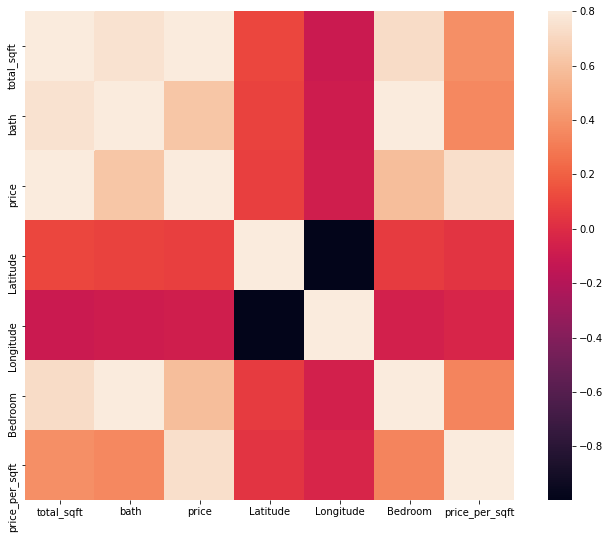

In [66]:
# Correlation Matrix Heatmap
corrmat = house_df.corr()
f, ax = plt.subplots(figsize=(12, 9))
sns.heatmap(corrmat, vmax=.8, square=True);

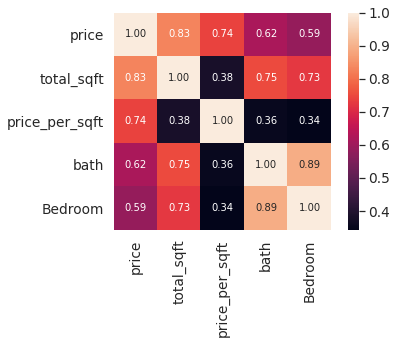

In [67]:
# Top Heatmap
k = 5 #number of variables for heatmap
cols = corrmat.nlargest(k, 'price')['price'].index
cm = np.corrcoef(house_df[cols].values.T)
sns.set(font_scale=1.25)
hm = sns.heatmap(cm, cbar=True, annot=True, square=True, fmt='.2f', annot_kws={'size': 10}, yticklabels=cols.values, xticklabels=cols.values)
plt.show()

In [68]:
#finding most correlated Features 
most_corr = pd.DataFrame(cols)
most_corr.columns = ['Most Correlated Features']
most_corr

,Most Correlated Features
0,price
1,total_sqft
2,price_per_sqft
3,bath
4,Bedroom


In [69]:
# getting rid of unnecessary columns
df = house_df.drop(columns = ['Latitude', 'Longitude', 'price_per_sqft', 'size'])
df.head()

,location,total_sqft,bath,price,Bedroom
0,"1st Block Jayanagar, Bangalore",2850.0,4.0,428.0,4
1,"1st Block Jayanagar, Bangalore",1630.0,3.0,194.0,3
2,"1st Block Jayanagar, Bangalore",1875.0,2.0,235.0,3
3,"1st Block Jayanagar, Bangalore",1200.0,2.0,130.0,3
4,"1st Block Jayanagar, Bangalore",1235.0,2.0,148.0,2


##### **One Hot Encoding of Location feature**

In [70]:
dummies = pd.get_dummies(df['location'])
dummies.head()

,"1st Block Jayanagar, Bangalore","1st Phase JP Nagar, Bangalore","2nd Phase Judicial Layout, Bangalore","2nd Stage Nagarbhavi, Bangalore","5th Block Hbr Layout, Bangalore","5th Phase JP Nagar, Bangalore","6th Phase JP Nagar, Bangalore","7th Phase JP Nagar, Bangalore","8th Phase JP Nagar, Bangalore","9th Phase JP Nagar, Bangalore","AECS Layout, Bangalore","Abbigere, Bangalore","Akshaya Nagar, Bangalore","Ambalipura, Bangalore","Ambedkar Nagar, Bangalore","Amruthahalli, Bangalore","Anandapura, Bangalore","Ananth Nagar, Bangalore","Anekal, Bangalore","Anjanapura, Bangalore","Ardendale, Bangalore","Arekere, Bangalore","Attibele, Bangalore","BEML Layout, Bangalore","BTM 2nd Stage, Bangalore","BTM Layout, Bangalore","Babusapalaya, Bangalore","Badavala Nagar, Bangalore","Balagere, Bangalore","Banashankari Stage II, Bangalore","Banashankari Stage III, Bangalore","Banashankari Stage V, Bangalore","Banashankari Stage VI, Bangalore","Banashankari, Bangalore","Banaswadi, Bangalore","Banjara Layout, Bangalore","Bannerghatta Road, Bangalore","Bannerghatta, Bangalore","Basavangudi, Bangalore","Basaveshwara Nagar, Bangalore",...,"Sanjay nagar, Bangalore","Sarakki Nagar, Bangalore","Sarjapur Road, Bangalore","Sarjapur, Bangalore","Sarjapura - Attibele Road, Bangalore","Sector 2 HSR Layout, Bangalore","Sector 7 HSR Layout, Bangalore","Seegehalli, Bangalore","Shampura, Bangalore","Shivaji Nagar, Bangalore","Singasandra, Bangalore","Somasundara Palya, Bangalore","Sompura, Bangalore","Sonnenahalli, Bangalore","Subramanyapura, Bangalore","Sultan Palaya, Bangalore","TC Palaya, Bangalore","Talaghattapura, Bangalore","Thanisandra, Bangalore","Thigalarapalya, Bangalore","Thubarahalli, Bangalore","Tindlu, Bangalore","Tumkur Road, Bangalore","Ulsoor, Bangalore","Uttarahalli, Bangalore","Varthur Road, Bangalore","Varthur, Bangalore","Vasanthapura, Bangalore","Vidyaranyapura, Bangalore","Vijayanagar, Bangalore","Vishveshwarya Layout, Bangalore","Vishwapriya Layout, Bangalore","Vittasandra, Bangalore","Whitefield, Bangalore","Yelachenahalli, Bangalore","Yelahanka New Town, Bangalore","Yelahanka, Bangalore","Yelenahalli, Bangalore","Yeshwanthpur, Bangalore",other
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [71]:
# To avoid dummy trap variable trap, lets drop any one of the column i.e lets drop the 'other' column
df = pd.concat([df, dummies.drop('other',axis='columns')],axis='columns')
df.head()

,location,total_sqft,bath,price,Bedroom,"1st Block Jayanagar, Bangalore","1st Phase JP Nagar, Bangalore","2nd Phase Judicial Layout, Bangalore","2nd Stage Nagarbhavi, Bangalore","5th Block Hbr Layout, Bangalore","5th Phase JP Nagar, Bangalore","6th Phase JP Nagar, Bangalore","7th Phase JP Nagar, Bangalore","8th Phase JP Nagar, Bangalore","9th Phase JP Nagar, Bangalore","AECS Layout, Bangalore","Abbigere, Bangalore","Akshaya Nagar, Bangalore","Ambalipura, Bangalore","Ambedkar Nagar, Bangalore","Amruthahalli, Bangalore","Anandapura, Bangalore","Ananth Nagar, Bangalore","Anekal, Bangalore","Anjanapura, Bangalore","Ardendale, Bangalore","Arekere, Bangalore","Attibele, Bangalore","BEML Layout, Bangalore","BTM 2nd Stage, Bangalore","BTM Layout, Bangalore","Babusapalaya, Bangalore","Badavala Nagar, Bangalore","Balagere, Bangalore","Banashankari Stage II, Bangalore","Banashankari Stage III, Bangalore","Banashankari Stage V, Bangalore","Banashankari Stage VI, Bangalore","Banashankari, Bangalore","Banaswadi, Bangalore",...,"Sahakara Nagar, Bangalore","Sanjay nagar, Bangalore","Sarakki Nagar, Bangalore","Sarjapur Road, Bangalore","Sarjapur, Bangalore","Sarjapura - Attibele Road, Bangalore","Sector 2 HSR Layout, Bangalore","Sector 7 HSR Layout, Bangalore","Seegehalli, Bangalore","Shampura, Bangalore","Shivaji Nagar, Bangalore","Singasandra, Bangalore","Somasundara Palya, Bangalore","Sompura, Bangalore","Sonnenahalli, Bangalore","Subramanyapura, Bangalore","Sultan Palaya, Bangalore","TC Palaya, Bangalore","Talaghattapura, Bangalore","Thanisandra, Bangalore","Thigalarapalya, Bangalore","Thubarahalli, Bangalore","Tindlu, Bangalore","Tumkur Road, Bangalore","Ulsoor, Bangalore","Uttarahalli, Bangalore","Varthur Road, Bangalore","Varthur, Bangalore","Vasanthapura, Bangalore","Vidyaranyapura, Bangalore","Vijayanagar, Bangalore","Vishveshwarya Layout, Bangalore","Vishwapriya Layout, Bangalore","Vittasandra, Bangalore","Whitefield, Bangalore","Yelachenahalli, Bangalore","Yelahanka New Town, Bangalore","Yelahanka, Bangalore","Yelenahalli, Bangalore","Yeshwanthpur, Bangalore"
0,"1st Block Jayanagar, Bangalore",2850.0,4.0,428.0,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,"1st Block Jayanagar, Bangalore",1630.0,3.0,194.0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,"1st Block Jayanagar, Bangalore",1875.0,2.0,235.0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,"1st Block Jayanagar, Bangalore",1200.0,2.0,130.0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,"1st Block Jayanagar, Bangalore",1235.0,2.0,148.0,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [72]:
df = df.drop('location',axis='columns')
df.head(2)

,total_sqft,bath,price,Bedroom,"1st Block Jayanagar, Bangalore","1st Phase JP Nagar, Bangalore","2nd Phase Judicial Layout, Bangalore","2nd Stage Nagarbhavi, Bangalore","5th Block Hbr Layout, Bangalore","5th Phase JP Nagar, Bangalore","6th Phase JP Nagar, Bangalore","7th Phase JP Nagar, Bangalore","8th Phase JP Nagar, Bangalore","9th Phase JP Nagar, Bangalore","AECS Layout, Bangalore","Abbigere, Bangalore","Akshaya Nagar, Bangalore","Ambalipura, Bangalore","Ambedkar Nagar, Bangalore","Amruthahalli, Bangalore","Anandapura, Bangalore","Ananth Nagar, Bangalore","Anekal, Bangalore","Anjanapura, Bangalore","Ardendale, Bangalore","Arekere, Bangalore","Attibele, Bangalore","BEML Layout, Bangalore","BTM 2nd Stage, Bangalore","BTM Layout, Bangalore","Babusapalaya, Bangalore","Badavala Nagar, Bangalore","Balagere, Bangalore","Banashankari Stage II, Bangalore","Banashankari Stage III, Bangalore","Banashankari Stage V, Bangalore","Banashankari Stage VI, Bangalore","Banashankari, Bangalore","Banaswadi, Bangalore","Banjara Layout, Bangalore",...,"Sahakara Nagar, Bangalore","Sanjay nagar, Bangalore","Sarakki Nagar, Bangalore","Sarjapur Road, Bangalore","Sarjapur, Bangalore","Sarjapura - Attibele Road, Bangalore","Sector 2 HSR Layout, Bangalore","Sector 7 HSR Layout, Bangalore","Seegehalli, Bangalore","Shampura, Bangalore","Shivaji Nagar, Bangalore","Singasandra, Bangalore","Somasundara Palya, Bangalore","Sompura, Bangalore","Sonnenahalli, Bangalore","Subramanyapura, Bangalore","Sultan Palaya, Bangalore","TC Palaya, Bangalore","Talaghattapura, Bangalore","Thanisandra, Bangalore","Thigalarapalya, Bangalore","Thubarahalli, Bangalore","Tindlu, Bangalore","Tumkur Road, Bangalore","Ulsoor, Bangalore","Uttarahalli, Bangalore","Varthur Road, Bangalore","Varthur, Bangalore","Vasanthapura, Bangalore","Vidyaranyapura, Bangalore","Vijayanagar, Bangalore","Vishveshwarya Layout, Bangalore","Vishwapriya Layout, Bangalore","Vittasandra, Bangalore","Whitefield, Bangalore","Yelachenahalli, Bangalore","Yelahanka New Town, Bangalore","Yelahanka, Bangalore","Yelenahalli, Bangalore","Yeshwanthpur, Bangalore"
0,2850.0,4.0,428.0,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,194.0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
target = df['price']
features =  df.drop(columns = ['price'], axis = 'columns')

In [74]:
features.head()

,total_sqft,bath,Bedroom,"1st Block Jayanagar, Bangalore","1st Phase JP Nagar, Bangalore","2nd Phase Judicial Layout, Bangalore","2nd Stage Nagarbhavi, Bangalore","5th Block Hbr Layout, Bangalore","5th Phase JP Nagar, Bangalore","6th Phase JP Nagar, Bangalore","7th Phase JP Nagar, Bangalore","8th Phase JP Nagar, Bangalore","9th Phase JP Nagar, Bangalore","AECS Layout, Bangalore","Abbigere, Bangalore","Akshaya Nagar, Bangalore","Ambalipura, Bangalore","Ambedkar Nagar, Bangalore","Amruthahalli, Bangalore","Anandapura, Bangalore","Ananth Nagar, Bangalore","Anekal, Bangalore","Anjanapura, Bangalore","Ardendale, Bangalore","Arekere, Bangalore","Attibele, Bangalore","BEML Layout, Bangalore","BTM 2nd Stage, Bangalore","BTM Layout, Bangalore","Babusapalaya, Bangalore","Badavala Nagar, Bangalore","Balagere, Bangalore","Banashankari Stage II, Bangalore","Banashankari Stage III, Bangalore","Banashankari Stage V, Bangalore","Banashankari Stage VI, Bangalore","Banashankari, Bangalore","Banaswadi, Bangalore","Banjara Layout, Bangalore","Bannerghatta Road, Bangalore",...,"Sahakara Nagar, Bangalore","Sanjay nagar, Bangalore","Sarakki Nagar, Bangalore","Sarjapur Road, Bangalore","Sarjapur, Bangalore","Sarjapura - Attibele Road, Bangalore","Sector 2 HSR Layout, Bangalore","Sector 7 HSR Layout, Bangalore","Seegehalli, Bangalore","Shampura, Bangalore","Shivaji Nagar, Bangalore","Singasandra, Bangalore","Somasundara Palya, Bangalore","Sompura, Bangalore","Sonnenahalli, Bangalore","Subramanyapura, Bangalore","Sultan Palaya, Bangalore","TC Palaya, Bangalore","Talaghattapura, Bangalore","Thanisandra, Bangalore","Thigalarapalya, Bangalore","Thubarahalli, Bangalore","Tindlu, Bangalore","Tumkur Road, Bangalore","Ulsoor, Bangalore","Uttarahalli, Bangalore","Varthur Road, Bangalore","Varthur, Bangalore","Vasanthapura, Bangalore","Vidyaranyapura, Bangalore","Vijayanagar, Bangalore","Vishveshwarya Layout, Bangalore","Vishwapriya Layout, Bangalore","Vittasandra, Bangalore","Whitefield, Bangalore","Yelachenahalli, Bangalore","Yelahanka New Town, Bangalore","Yelahanka, Bangalore","Yelenahalli, Bangalore","Yeshwanthpur, Bangalore"
0,2850.0,4.0,4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1630.0,3.0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1875.0,2.0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1200.0,2.0,3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1235.0,2.0,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [75]:
features.shape

(7239, 243)

In [76]:
target.head()

0    428.0
1    194.0
2    235.0
3    130.0
4    148.0
Name: price, dtype: float64

In [77]:
target.shape

(7239,)

### **Train Test Split**

In [78]:
# Split data into train and test set

X_train, X_test, y_train, y_test = train_test_split(features, target, test_size = 0.2, random_state = 10)

# View number of training and testing data
print('Training Dependent variable contains:', len(y_train), 'rows')
print('Training Independent variable contains:', len(X_train), 'rows')
print('Testing Dependent variable contains:', len(y_test), 'rows')
print('Testing Independent variable contains:', len(X_test), 'rows')

Training Dependent variable contains: 5791 rows
Training Independent variable contains: 5791 rows
Testing Dependent variable contains: 1448 rows
Testing Independent variable contains: 1448 rows


## **Linear Regression**

In [79]:
# Linear Regression Model

lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_score = lr_model.score(X_test, y_test)
print(' Linear Regression R^2 for test is: ', lr_score)

 Linear Regression R^2 for test is:  0.8714168721388086


The r-squared value is the measure of how close the data are to the fitted regression line. It takes a value between 0 and 1, 1 meaning that all of the variance in the target is explained by the data. In general, a higher r-squared value means a better fit.

In [80]:
#The RMSE measures the distance between our predicted values and actual values.
lr_predictions = lr_model.predict(X_test)
print ('RMSE is: ', mean_squared_error(y_test, lr_predictions))

RMSE is:  700.3654852218536


In [81]:
# Cross validation
cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)

lr_cross_val = cross_val_score(LinearRegression(), features, target, cv=cv)
print('Accuracy(Cross Validation Score): %3f%% (%.3f%%)' % (lr_cross_val.mean()*100.0, lr_cross_val.std()*100.0))

Accuracy(Cross Validation Score): 83.389006% (2.854%)


Let's predict house prices for some locations

In [0]:
def predict_price(location,total_sqft,bath,Bedroom):    
    loc_index = np.where(features.columns==location)[0][0]

    x = np.zeros(len(features.columns))
    x[0] = total_sqft
    x[1] = bath
    x[2] = Bedroom
    if loc_index >= 0:
        x[loc_index] = 1

    return lr_model.predict([x])[0]

In [83]:
# Predicting in Whitefield, Bangalore with sqft size as 1280, bedroom size as 2 and bathroom size as 2.
predict_price('Whitefield, Bangalore',1280, 2, 2)

74.57376538044042

In [84]:
# Predicting in 1st Phase JP Nagar, Bangalore with sqft size as 1394, bedroom size as 2 and bathroom size as 2.
predict_price('1st Phase JP Nagar, Bangalore',1394, 2, 2)

117.11819533124137

## **Grid Search to find best models**

In [85]:
model_params = {                        
                    #linearRegression
                    'linear_regression': {
                         'model': LinearRegression(),
                         'params': {
                             
                                    'normalize': [True, False]
                            }
                    },  
                    #decision_tree
                    'decision_tree' : {
                        'model': DecisionTreeRegressor(),
                        'params': {
                            'max_depth':[1,5,10,20,50,100,200],
                            'criterion':['mse','friedman_mse'],
                            'splitter': ['best','random']
                        }
                    },
                    #Lasso
                    'lasso': {
                        'model': Lasso(),
                        'params': {
                                    #'max_iter': [1,5,10,20,50],
                                    'alpha': [0.02, 0.024, 0.025, 0.026, 0.03, 0.05, 0.5, 1,2],
                                    'selection': ['random', 'cyclic'],
                                    'normalize':[True, False]
                            }
                    },  
                    #Ridge
                    'ridge': {
                        'model': Ridge(),
                        'params': {
                                    #'max_iter': [1, 5, 10,20,50],
                                    'alpha': [0.05, 0.1, 0.5, 1, 5, 10, 200, 230, 250,265, 270, 275, 290, 300,500],
                                    'normalize':[True, False]
                        }
                    },      
                }
    
scores=[]

cv = ShuffleSplit(n_splits=5, test_size=0.2, random_state=0)
for model_name, mp in model_params.items():
    GS_CV = GridSearchCV(mp['model'], mp['params'], cv = cv, return_train_score = False)
    GS_CV.fit(features,target)
    scores.append({
        'model': model_name,
        'best_score': GS_CV.best_score_,
        'best_params': GS_CV.best_params_
    })
    

df_GS_CV = pd.DataFrame(scores)
df_GS_CV

,model,best_score,best_params
0,linear_regression,0.833890,{'normalize': True}
1,decision_tree,0.754974,"{'criterion': 'friedman_mse', 'max_depth': 20,..."
2,lasso,0.817645,"{'alpha': 0.02, 'normalize': False, 'selection..."
3,ridge,0.835271,"{'alpha': 0.05, 'normalize': True}"


Grid Search return Ridge regression as the best model.

## **Gradient Boosting Regressor**

In [86]:
# GBR model
GBR=GradientBoostingRegressor()
gbr_model=GBR.fit(X_train,y_train)
print ("GBR R^2 for test is:", gbr_model.score(X_test, y_test))
# RMSE Calculations
gbr_predictions = gbr_model.predict(X_test)
print ('RMSE is: ', mean_squared_error(y_test, gbr_predictions))
# Cross Validation score
gbr_cross_val = cross_val_score(GBR, features, target, cv=cv)
print('Accuracy(Cross Validation Score): %3f%% (%.3f%%)' % (gbr_cross_val.mean()*100.0, gbr_cross_val.std()*100.0))

GBR R^2 for test is: 0.8370049255549653
RMSE is:  887.800182662403
Accuracy(Cross Validation Score): 77.973392% (6.683%)


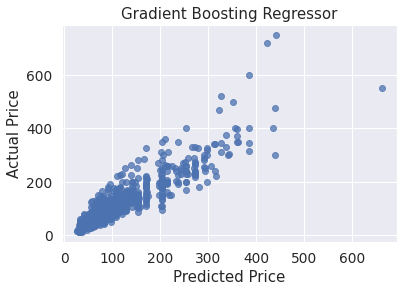

In [87]:
# Plot of variation between predicted price and actual price
actual_values = y_test
plt.scatter(gbr_predictions, actual_values, alpha=.75,
            color='b') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('Gradient Boosting Regressor')
plt.show()

## **Ridge Regression**

In [88]:
ridge=Ridge()
ridge_model=ridge.fit(X_train,y_train)
print ("Ridge R^2 for test is:", ridge_model.score(X_test, y_test))
# RMSE Calculations
ridge_predictions = ridge_model.predict(X_test)
print ('RMSE is: ', mean_squared_error(y_test, ridge_predictions))
# Cross Validation score
ridge_cross_val = cross_val_score(ridge, features, target, cv=cv)
print('Accuracy(Cross Validation Score): %3f%% (%.3f%%)' % (ridge_cross_val.mean()*100.0, ridge_cross_val.std()*100.0))

Ridge R^2 for test is: 0.8681384119227891
RMSE is:  718.2225743918403
Accuracy(Cross Validation Score): 83.338816% (2.852%)


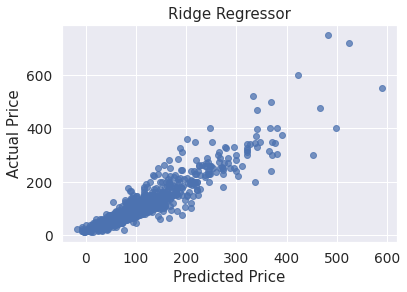

In [89]:
# Plot of variation between predicted price and actual price
actual_values = y_test
plt.scatter(ridge_predictions, actual_values, alpha=.75,
            color='b') #alpha helps to show overlapping data
plt.xlabel('Predicted Price')
plt.ylabel('Actual Price')
plt.title('Ridge Regressor')
plt.show()

## **Kernel Ridge Regressor**

In [90]:
kridge=KernelRidge()
kridge_model=kridge.fit(X_train,y_train)
print ("Kernel Ridge R^2 for test is:", kridge_model.score(X_test, y_test))
# RMSE Calculations
kridge_predictions = kridge_model.predict(X_test)
print ('RMSE is: ', mean_squared_error(y_test, kridge_predictions))
# Cross Validation score
kridge_cross_val = cross_val_score(kridge, features, target, cv=cv)
print('Accuracy(Cross Validation Score): %3f%% (%.3f%%)' % (kridge_cross_val.mean()*100.0, kridge_cross_val.std()*100.0))

Kernel Ridge R^2 for test is: 0.8676392821998321
RMSE is:  720.9412299139298
Accuracy(Cross Validation Score): 83.327181% (2.938%)


## **Random Forest Regressor**

In [91]:
Rf=RandomForestRegressor()
Rf_model=Rf.fit(X_train,y_train)
print ("Random Forest R^2 for test is:", Rf_model.score(X_test, y_test))
# RMSE Calculations
Rf_predictions = Rf_model.predict(X_test)
print ('RMSE is: ', mean_squared_error(y_test, Rf_predictions))
# Cross Validation score
Rf_cross_val = cross_val_score(Rf, features, target, cv=cv)
print('Accuracy(Cross Validation Score): %3f%% (%.3f%%)' % (Rf_cross_val.mean()*100.0, Rf_cross_val.std()*100.0))

Random Forest R^2 for test is: 0.7951353219952603
RMSE is:  1115.8551825749532
Accuracy(Cross Validation Score): 77.345819% (5.380%)


## **Elastic Net Regressor**

In [92]:
Enet=ElasticNet()
Enet_model=Enet.fit(X_train,y_train)
print ("Elastic Net R^2 for test is:", Enet_model.score(X_test, y_test))
# RMSE Calculations
Enet_predictions = Enet_model.predict(X_test)
print ('RMSE is: ', mean_squared_error(y_test, Enet_predictions))
# Cross Validation score
Enet_cross_val = cross_val_score(Enet, features, target, cv=cv)
print('Accuracy(Cross Validation Score): %3f%% (%.3f%%)' % (Enet_cross_val.mean()*100.0, Enet_cross_val.std()*100.0))

Elastic Net R^2 for test is: 0.7366826565223646
RMSE is:  1434.23466281772
Accuracy(Cross Validation Score): 70.803299% (2.230%)


## **Lasso Regressor**

In [93]:
LassoR=Lasso()
LassoR_model=LassoR.fit(X_train,y_train)
print ("Lasso R^2 for test is:", LassoR_model.score(X_test, y_test))
# RMSE Calculations
LassoR_predictions = LassoR_model.predict(X_test)
print ('RMSE is: ', mean_squared_error(y_test, LassoR_predictions))
# Cross Validation score
LassoR_cross_val = cross_val_score(LassoR, features, target, cv=cv)
print('Accuracy(Cross Validation Score): %3f%% (%.3f%%)' % (LassoR_cross_val.mean()*100.0, LassoR_cross_val.std()*100.0))

Lasso R^2 for test is: 0.7406822698085469
RMSE is:  1412.4496032498678
Accuracy(Cross Validation Score): 70.762387% (2.484%)


## **XGB Regressor**

In [94]:
XGB=xgb.XGBRegressor()
XGB_model=XGB.fit(X_train,y_train)
print ("XGB R^2 for test is:", XGB_model.score(X_test, y_test))
# RMSE Calculations
XGB_predictions = XGB_model.predict(X_test)
print ('RMSE is: ', mean_squared_error(y_test, XGB_predictions))
# Cross Validation score
XGB_cross_val = cross_val_score(XGB, features, target, cv=cv)
print('Accuracy(Cross Validation Score): %3f%% (%.3f%%)' % (XGB_cross_val.mean()*100.0, XGB_cross_val.std()*100.0))

[13:27:14] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
XGB R^2 for test is: 0.8364497053021998
RMSE is:  890.8243516043259
[13:27:17] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:27:19] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:27:22] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:27:24] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
[13:27:27] WARNING: /workspace/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Accuracy(Cross Validation Score): 77.274904% (6.802%)


## **Residual Plot**

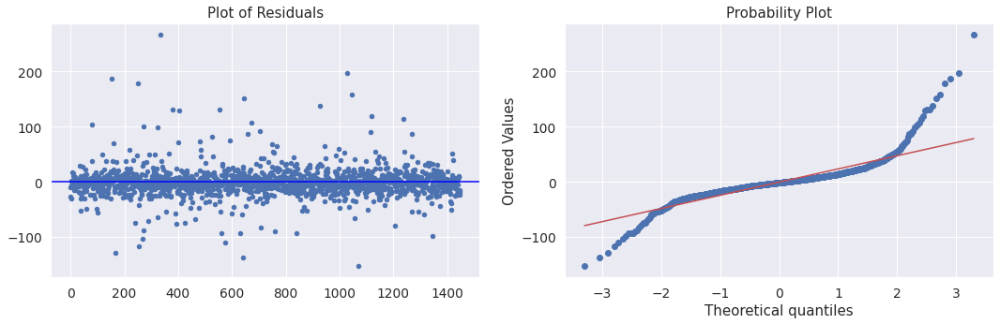

In [95]:
# calculate the residuals
ridge_preds = pd.DataFrame(ridge_predictions)
y_test = y_test.reset_index(drop=True)
residuals = y_test - ridge_preds[0]

# Plotting residual and probability graph
plt.figure(figsize=(18,5))
plt.subplot(1,2,1)
plt.axhline(0, color='blue')
plt.title('Plot of Residuals')
plt.scatter(residuals.index, residuals, s=20)

plt.subplot(1,2,2)
plt.title('Probability Plot')
stats.probplot(residuals, dist='norm', plot=plt)
plt.show()